In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
!pip install scikit-image

In [3]:
!pip install opencv-python

In [4]:
!pip install opencv-python-headless

In [5]:
!pip install editdistance

In [6]:
import numpy as np
import torch
from torch.utils.data import DataLoader
from torch.nn import CTCLoss
import matplotlib.pyplot as plt
import json
import pickle
from typing import Any, Optional
from collections import OrderedDict

import sys
sys.path.append("..")

import torch
from torch.nn.functional import log_softmax
from torch.nn import Conv2d, AdaptiveMaxPool2d
from torch.nn import Module


class Decoder(Module):
    def __init__(self, params):
        super(Decoder, self).__init__()

        self.vocab_size = params["vocab_size"]

        self.ada_pool = AdaptiveMaxPool2d((1, None))
        self.end_conv = Conv2d(in_channels=256, out_channels=self.vocab_size+1, kernel_size=(1, 1))

    def forward(self, x):
        x = self.ada_pool(x)
        x = self.end_conv(x)
        x = torch.squeeze(x, dim=2)
        return log_softmax(x, dim=1)

from torch.nn import Module, ModuleList
from torch.nn import Conv2d, InstanceNorm2d, Dropout, Dropout2d
from torch.nn import ReLU
from torch.nn.functional import pad
import random


class DepthSepConv2D(Module):
    def __init__(self, in_channels, out_channels, kernel_size, activation=None, padding=True, stride=(1, 1), dilation=(1, 1)):
        super(DepthSepConv2D, self).__init__()

        self.padding = None

        if padding:
            if padding is True:
                padding = [int((k - 1) / 2) for k in kernel_size]
                if kernel_size[0] % 2 == 0 or kernel_size[1] % 2 == 0:
                    padding_h = kernel_size[1] - 1
                    padding_w = kernel_size[0] - 1
                    self.padding = [padding_h//2, padding_h-padding_h//2, padding_w//2, padding_w-padding_w//2]
                    padding = (0, 0)

        else:
            padding = (0, 0)
        self.depth_conv = Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=kernel_size, dilation=dilation, stride=stride, padding=padding, groups=in_channels)
        self.point_conv = Conv2d(in_channels=in_channels, out_channels=out_channels, dilation=dilation, kernel_size=(1, 1))
        self.activation = activation

    def forward(self, x):
        x = self.depth_conv(x)
        if self.padding:
            x = pad(x, self.padding)
        if self.activation:
            x = self.activation(x)
        x = self.point_conv(x)
        return x


class MixDropout(Module):
    def __init__(self, dropout_proba=0.4, dropout2d_proba=0.2):
        super(MixDropout, self).__init__()

        self.dropout = Dropout(dropout_proba)
        self.dropout2d = Dropout2d(dropout2d_proba)

    def forward(self, x):
        if random.random() < 0.5:
            return self.dropout(x)
        return self.dropout2d(x)


class FCN_Encoder(Module):
    def __init__(self, params):
        super(FCN_Encoder, self).__init__()

        self.dropout = params["dropout"]

        self.init_blocks = ModuleList([
            ConvBlock(params["input_channels"], 16, stride=(1, 1), dropout=self.dropout),
            ConvBlock(16, 32, stride=(2, 2), dropout=self.dropout),
            ConvBlock(32, 64, stride=(2, 2), dropout=self.dropout),
            ConvBlock(64, 128, stride=(2, 2), dropout=self.dropout),
            ConvBlock(128, 128, stride=(2, 1), dropout=self.dropout),
            ConvBlock(128, 128, stride=(2, 1), dropout=self.dropout),
        ])
        self.blocks = ModuleList([
            DSCBlock(128, 128, pool=(1, 1), dropout=self.dropout),
            DSCBlock(128, 128, pool=(1, 1), dropout=self.dropout),
            DSCBlock(128, 128, pool=(1, 1), dropout=self.dropout),
            DSCBlock(128, 256, pool=(1, 1), dropout=self.dropout),
        ])

    def forward(self, x):
        for b in self.init_blocks:
            x = b(x)
        for b in self.blocks:
            xt = b(x)
            x = x + xt if x.size() == xt.size() else xt
        return x


class ConvBlock(Module):

    def __init__(self, in_, out_, stride=(1, 1), k=3, activation=ReLU, dropout=0.4):
        super(ConvBlock, self).__init__()

        self.activation = activation()
        self.conv1 = Conv2d(in_channels=in_, out_channels=out_, kernel_size=k, padding=k // 2)
        self.conv2 = Conv2d(in_channels=out_, out_channels=out_, kernel_size=k, padding=k // 2)
        self.conv3 = Conv2d(out_, out_, kernel_size=(3, 3), padding=(1, 1), stride=stride)
        self.norm_layer = InstanceNorm2d(out_, eps=0.001, momentum=0.99, track_running_stats=False)
        self.dropout = MixDropout(dropout_proba=dropout, dropout2d_proba=dropout / 2)

    def forward(self, x):
        pos = random.randint(1, 3)
        x = self.conv1(x)
        x = self.activation(x)

        if pos == 1:
            x = self.dropout(x)

        x = self.conv2(x)
        x = self.activation(x)

        if pos == 2:
            x = self.dropout(x)

        x = self.norm_layer(x)
        x = self.conv3(x)
        x = self.activation(x)

        if pos == 3:
            x = self.dropout(x)
        return x


class DSCBlock(Module):

    def __init__(self, in_, out_, pool=(2, 1), activation=ReLU, dropout=0.4):
        super(DSCBlock, self).__init__()

        self.activation = activation()
        self.conv1 = DepthSepConv2D(in_, out_, kernel_size=(3, 3))
        self.conv2 = DepthSepConv2D(out_, out_, kernel_size=(3, 3))
        self.conv3 = DepthSepConv2D(out_, out_, kernel_size=(3, 3), padding=(1, 1), stride=pool)
        self.norm_layer = InstanceNorm2d(out_, eps=0.001, momentum=0.99, track_running_stats=False)
        self.dropout = MixDropout(dropout_proba=dropout, dropout2d_proba=dropout/2)

    def forward(self, x):
        pos = random.randint(1, 3)
        x = self.conv1(x)
        x = self.activation(x)

        if pos == 1:
            x = self.dropout(x)

        x = self.conv2(x)
        x = self.activation(x)

        if pos == 2:
            x = self.dropout(x)

        x = self.norm_layer(x)
        x = self.conv3(x)

        if pos == 3:
            x = self.dropout(x)
        return x
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.distributed import DistributedSampler
from torchvision.transforms.functional import adjust_brightness, adjust_contrast
from torchvision.transforms import RandomPerspective
#  Copyright Université de Rouen Normandie (1), INSA Rouen (2),
#  tutelles du laboratoire LITIS (1 et 2)
#  contributors :
#  - Denis Coquenet
#
#
#  This software is a computer program written in XXX whose purpose is XXX.
#
#  This software is governed by the CeCILL-C license under French law and
#  abiding by the rules of distribution of free software.  You can  use,
#  modify and/ or redistribute the software under the terms of the CeCILL-C
#  license as circulated by CEA, CNRS and INRIA at the following URL
#  "http://www.cecill.info".
#
#  As a counterpart to the access to the source code and  rights to copy,
#  modify and redistribute granted by the license, users are provided only
#  with a limited warranty  and the software's author,  the holder of the
#  economic rights,  and the successive licensors  have only  limited
#  liability.
#
#  In this respect, the user's attention is drawn to the risks associated
#  with loading,  using,  modifying and/or developing or reproducing the
#  software by the user in light of its specific status of free software,
#  that may mean  that it is complicated to manipulate,  and  that  also
#  therefore means  that it is reserved for developers  and  experienced
#  professionals having in-depth computer knowledge. Users are therefore
#  encouraged to load and test the software's suitability as regards their
#  requirements in conditions enabling the security of their systems and/or
#  data to be ensured and,  more generally, to use and operate it in the
#  same conditions as regards security.
#
#  The fact that you are presently reading this means that you have had
#  knowledge of the CeCILL-C license and that you accept its terms.

import itertools
import numpy as np
from skimage import transform as stf
from numpy import random, floor
from PIL import Image, ImageOps
from cv2 import erode, dilate

"""
Each transform class defined here takes as input a PIL Image and returns the modified PIL Image
"""


class SignFlipping:
    """
    Color inversion
    """

    def __init__(self):
        pass

    def __call__(self, x):
        return ImageOps.invert(x)


class DPIAdjusting:
    """
    Resolution modification
    """

    def __init__(self, factor):
        self.factor = factor

    def __call__(self, x):
        w, h = x.size
        return x.resize((int(np.ceil(w * self.factor)), int(np.ceil(h * self.factor))), Image.BILINEAR)


class Dilation:
    """
    OCR: stroke width increasing
    """

    def __init__(self, kernel, iterations):
        self.kernel = np.ones(kernel, np.uint8)
        self.iterations = iterations

    def __call__(self, x):
        return Image.fromarray(dilate(np.array(x), self.kernel, iterations=self.iterations))


class Erosion:
    """
    OCR: stroke width decreasing
    """

    def __init__(self, kernel, iterations):
        self.kernel = np.ones(kernel, np.uint8)
        self.iterations = iterations

    def __call__(self, x):
        return Image.fromarray(erode(np.array(x), self.kernel, iterations=self.iterations))


class ElasticDistortion:
    """
    Elastic Distortion adapted from https://github.com/IntuitionMachines/OrigamiNet
    Used in "OrigamiNet: Weakly-Supervised, Segmentation-Free, One-Step, Full Page TextRecognition by learning to unfold",
        Yousef, Mohamed and Bishop, Tom E., The IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2020
    """
    def __init__(self, grid, magnitude, min_sep):

        self.grid_width, self.grid_height = grid
        self.xmagnitude, self.ymagnitude = magnitude
        self.min_h_sep, self.min_v_sep = min_sep

    def __call__(self, x):
        w, h = x.size

        horizontal_tiles = self.grid_width
        vertical_tiles = self.grid_height

        width_of_square = int(floor(w / float(horizontal_tiles)))
        height_of_square = int(floor(h / float(vertical_tiles)))

        width_of_last_square = w - (width_of_square * (horizontal_tiles - 1))
        height_of_last_square = h - (height_of_square * (vertical_tiles - 1))

        dimensions = []
        shift = [[(0, 0) for x in range(horizontal_tiles)] for y in range(vertical_tiles)]

        for vertical_tile in range(vertical_tiles):
            for horizontal_tile in range(horizontal_tiles):
                if vertical_tile == (vertical_tiles - 1) and horizontal_tile == (horizontal_tiles - 1):
                    dimensions.append([horizontal_tile * width_of_square,
                                       vertical_tile * height_of_square,
                                       width_of_last_square + (horizontal_tile * width_of_square),
                                       height_of_last_square + (height_of_square * vertical_tile)])
                elif vertical_tile == (vertical_tiles - 1):
                    dimensions.append([horizontal_tile * width_of_square,
                                       vertical_tile * height_of_square,
                                       width_of_square + (horizontal_tile * width_of_square),
                                       height_of_last_square + (height_of_square * vertical_tile)])
                elif horizontal_tile == (horizontal_tiles - 1):
                    dimensions.append([horizontal_tile * width_of_square,
                                       vertical_tile * height_of_square,
                                       width_of_last_square + (horizontal_tile * width_of_square),
                                       height_of_square + (height_of_square * vertical_tile)])
                else:
                    dimensions.append([horizontal_tile * width_of_square,
                                       vertical_tile * height_of_square,
                                       width_of_square + (horizontal_tile * width_of_square),
                                       height_of_square + (height_of_square * vertical_tile)])

                sm_h = min(self.xmagnitude, width_of_square - (self.min_h_sep + shift[vertical_tile][horizontal_tile - 1][
                    0])) if horizontal_tile > 0 else self.xmagnitude
                sm_v = min(self.ymagnitude, height_of_square - (self.min_v_sep + shift[vertical_tile - 1][horizontal_tile][
                    1])) if vertical_tile > 0 else self.ymagnitude

                dx = random.randint(-sm_h, self.xmagnitude)
                dy = random.randint(-sm_v, self.ymagnitude)
                shift[vertical_tile][horizontal_tile] = (dx, dy)

        shift = list(itertools.chain.from_iterable(shift))

        last_column = []
        for i in range(vertical_tiles):
            last_column.append((horizontal_tiles - 1) + horizontal_tiles * i)

        last_row = range((horizontal_tiles * vertical_tiles) - horizontal_tiles, horizontal_tiles * vertical_tiles)

        polygons = []
        for x1, y1, x2, y2 in dimensions:
            polygons.append([x1, y1, x1, y2, x2, y2, x2, y1])

        polygon_indices = []
        for i in range((vertical_tiles * horizontal_tiles) - 1):
            if i not in last_row and i not in last_column:
                polygon_indices.append([i, i + 1, i + horizontal_tiles, i + 1 + horizontal_tiles])

        for id, (a, b, c, d) in enumerate(polygon_indices):
            dx = shift[id][0]
            dy = shift[id][1]

            x1, y1, x2, y2, x3, y3, x4, y4 = polygons[a]
            polygons[a] = [x1, y1,
                           x2, y2,
                           x3 + dx, y3 + dy,
                           x4, y4]

            x1, y1, x2, y2, x3, y3, x4, y4 = polygons[b]
            polygons[b] = [x1, y1,
                           x2 + dx, y2 + dy,
                           x3, y3,
                           x4, y4]

            x1, y1, x2, y2, x3, y3, x4, y4 = polygons[c]
            polygons[c] = [x1, y1,
                           x2, y2,
                           x3, y3,
                           x4 + dx, y4 + dy]

            x1, y1, x2, y2, x3, y3, x4, y4 = polygons[d]
            polygons[d] = [x1 + dx, y1 + dy,
                           x2, y2,
                           x3, y3,
                           x4, y4]

        generated_mesh = []
        for i in range(len(dimensions)):
            generated_mesh.append([dimensions[i], polygons[i]])

        self.generated_mesh = generated_mesh

        return x.transform(x.size, Image.MESH, self.generated_mesh, resample=Image.BICUBIC)


class RandomTransform:
    """
    Random Transform adapted from https://github.com/IntuitionMachines/OrigamiNet
    Used in "OrigamiNet: Weakly-Supervised, Segmentation-Free, One-Step, Full Page TextRecognition by learning to unfold",
        Yousef, Mohamed and Bishop, Tom E., The IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2020
    """
    def __init__(self, val):

        self.val = val

    def __call__(self, x):
        w, h = x.size

        dw, dh = (self.val, 0) if random.randint(0, 2) == 0 else (0, self.val)

        def rd(d):
            return random.uniform(-d, d)

        def fd(d):
            return random.uniform(-dw, d)

        # generate a random projective transform
        # adapted from https://navoshta.com/traffic-signs-classification/
        tl_top = rd(dh)
        tl_left = fd(dw)
        bl_bottom = rd(dh)
        bl_left = fd(dw)
        tr_top = rd(dh)
        tr_right = fd(min(w * 3 / 4 - tl_left, dw))
        br_bottom = rd(dh)
        br_right = fd(min(w * 3 / 4 - bl_left, dw))

        tform = stf.ProjectiveTransform()
        tform.estimate(np.array((
            (tl_left, tl_top),
            (bl_left, h - bl_bottom),
            (w - br_right, h - br_bottom),
            (w - tr_right, tr_top)
        )), np.array((
            [0, 0],
            [0, h - 1],
            [w - 1, h - 1],
            [w - 1, 0]
        )))

        # determine shape of output image, to preserve size
        # trick take from the implementation of skimage.transform.rotate
        corners = np.array([
            [0, 0],
            [0, h - 1],
            [w - 1, h - 1],
            [w - 1, 0]
        ])

        corners = tform.inverse(corners)
        minc = corners[:, 0].min()
        minr = corners[:, 1].min()
        maxc = corners[:, 0].max()
        maxr = corners[:, 1].max()
        out_rows = maxr - minr + 1
        out_cols = maxc - minc + 1
        output_shape = np.around((out_rows, out_cols))

        # fit output image in new shape
        translation = (minc, minr)
        tform4 = stf.SimilarityTransform(translation=translation)
        tform = tform4 + tform
        # normalize
        tform.params /= tform.params[2, 2]

        x = stf.warp(np.array(x), tform, output_shape=output_shape, cval=255, preserve_range=True)
        x = stf.resize(x, (h, w), preserve_range=True).astype(np.uint8)

        return Image.fromarray(x)
#  Copyright Université de Rouen Normandie (1), INSA Rouen (2),
#  tutelles du laboratoire LITIS (1 et 2)
#  contributors :
#  - Denis Coquenet
#
#
#  This software is a computer program written in XXX whose purpose is XXX.
#
#  This software is governed by the CeCILL-C license under French law and
#  abiding by the rules of distribution of free software.  You can  use,
#  modify and/ or redistribute the software under the terms of the CeCILL-C
#  license as circulated by CEA, CNRS and INRIA at the following URL
#  "http://www.cecill.info".
#
#  As a counterpart to the access to the source code and  rights to copy,
#  modify and redistribute granted by the license, users are provided only
#  with a limited warranty  and the software's author,  the holder of the
#  economic rights,  and the successive licensors  have only  limited
#  liability.
#
#  In this respect, the user's attention is drawn to the risks associated
#  with loading,  using,  modifying and/or developing or reproducing the
#  software by the user in light of its specific status of free software,
#  that may mean  that it is complicated to manipulate,  and  that  also
#  therefore means  that it is reserved for developers  and  experienced
#  professionals having in-depth computer knowledge. Users are therefore
#  encouraged to load and test the software's suitability as regards their
#  requirements in conditions enabling the security of their systems and/or
#  data to be ensured and,  more generally, to use and operate it in the
#  same conditions as regards security.
#
#  The fact that you are presently reading this means that you have had
#  knowledge of the CeCILL-C license and that you accept its terms.

import editdistance
import re

# Charset / labels conversion

def LM_str_to_ind(labels, str):
    return [labels.index(c) for c in str]


def LM_ind_to_str(labels, ind, oov_symbol=None):
    if oov_symbol is not None:
        res = []
        for i in ind:
            if i < len(labels):
                res.append(labels[i])
            else:
                res.append(oov_symbol)
    else:
        res = [labels[i] for i in ind]
    return "".join(res)


# OCR METRICS


def edit_cer_from_list(truth, pred):
    edit = 0
    for t, p in zip(truth, pred):
        edit += editdistance.eval(t, p)
    return edit


def format_string_for_wer(str):
    str = re.sub('([\[\]{}/\\()\"\'&+*=<>?.;:,!\-—_€#%°])', r' \1 ', str)
    str = re.sub('([ \n])+', " ", str).strip()
    return str


def edit_wer_from_list(truth, pred):
    edit = 0
    for pred, gt in zip(pred, truth):
        gt = format_string_for_wer(gt)
        pred = format_string_for_wer(pred)
        gt = gt.split(" ")
        pred = pred.split(" ")
        edit += editdistance.eval(gt, pred)
    return edit


def nb_words_from_list(list_gt):
    len_ = 0
    for gt in list_gt:
        gt = format_string_for_wer(gt)
        gt = gt.split(" ")
        len_ += len(gt)
    return len_


def nb_chars_from_list(list_gt):
    return sum([len(t) for t in list_gt])


def cer_from_list_str(str_gt, str_pred):
    len_ = 0
    edit = 0
    for pred, gt in zip(str_pred, str_gt):
        edit += editdistance.eval(gt, pred)
        len_ += len(gt)
    cer = edit / len_
    return cer


def wer_from_list_str(str_gt, str_pred):
    len_ = 0
    edit = 0
    for pred, gt in zip(str_pred, str_gt):
        gt = format_string_for_wer(gt)
        pred = format_string_for_wer(pred)
        gt = gt.split(" ")
        pred = pred.split(" ")
        edit += editdistance.eval(gt, pred)
        len_ += len(gt)
    cer = edit / len_
    return cer


def cer_from_files(file_gt, file_pred):
    with open(file_pred, "r") as f_p:
        str_pred = f_p.readlines()
    with open(file_gt, "r") as f_gt:
        str_gt = f_gt.readlines()
    return cer_from_list_str(str_gt, str_pred)


def wer_from_files(file_gt, file_pred):
    with open(file_pred, "r") as f_p:
        str_pred = f_p.readlines()
    with open(file_gt, "r") as f_gt:
        str_gt = f_gt.readlines()
    return wer_from_list_str(str_gt, str_pred)
import os
import numpy as np
import pickle
from PIL import Image
import cv2
import copy
import torch


class DatasetManager:

    def __init__(self, params):
        self.params = params
        self.img_padding_value = params["config"]["padding_value"]
        self.dataset_class = params["dataset_class"]
        self.tokens = {
            "pad": params["config"]["padding_token"],
        }

        self.train_dataset = None
        self.valid_datasets = dict()
        self.test_datasets = dict()

        self.train_loader = None
        self.valid_loaders = dict()
        self.test_loaders = dict()

        self.train_sampler = None
        self.valid_samplers = dict()
        self.test_samplers = dict()

        self.charset = self.get_merged_charsets()
        self.load_datasets()

        # token configuration
        if params["config"]["charset_mode"].lower() == "ctc":
            self.tokens["blank"] = len(self.charset)
            self.tokens["pad"] = self.tokens["pad"] if self.tokens["pad"] else len(self.charset) + 1
            params["config"]["padding_token"] = self.tokens["pad"]
        elif params["config"]["charset_mode"] == "attention":
            self.tokens["end"] = len(self.charset)
            self.tokens["start"] = len(self.charset) + 1
            self.tokens["pad"] = self.tokens["pad"] if self.tokens["pad"] else len(self.charset) + 2
            if params["config"]["pad_label_with_end_token"]:
                params["config"]["padding_token"] = self.tokens["end"]
            else:
                params["config"]["padding_token"] = self.tokens["pad"]
        self.update_charset()
        self.my_collate_function = OCRCollateFunction(self.params["config"])

        self.load_ddp_samplers()
        self.load_dataloaders()

    def get_merged_charsets(self):
        datasets = self.params["datasets"]
        charset = set()
        for key in datasets.keys():
            with open(os.path.join(datasets[key], "labels.pkl"), "rb") as f:
                info = pickle.load(f)
                charset = charset.union(set(info["charset"]))
        if "\n" in charset:
            charset.remove("\n")
        if "¬" in charset:
            charset.remove("¬")
        if "" in charset:
            charset.remove("")
        return sorted(list(charset))

    def update_dataset(self, dataset):
        dataset.charset = self.charset
        dataset.tokens = self.tokens
        dataset.convert_labels()

    def load_datasets(self):
        self.train_dataset = self.dataset_class(self.params, "train", self.params["train"]["name"], self.get_paths_and_sets("train", self.params["train"]["datasets"]))
        self.params["config"]["mean"], self.params["config"]["std"] = self.train_dataset.compute_std_mean()

        for custom_name in self.params["valid"].keys():
            self.valid_datasets[custom_name] = self.dataset_class(self.params, "valid", custom_name, self.get_paths_and_sets("valid", self.params["valid"][custom_name]))

    def update_charset(self):
        self.train_dataset.charset = self.charset
        self.train_dataset.tokens = self.tokens
        self.train_dataset.convert_labels()
        for key in self.valid_datasets:
            self.update_dataset(self.valid_datasets[key])

    def load_ddp_samplers(self):
        if self.params["use_ddp"]:
            self.train_sampler = DistributedSampler(self.train_dataset, num_replicas=self.params["num_gpu"], rank=self.params["ddp_rank"], shuffle=True)
            for custom_name in self.valid_datasets.keys():
                self.valid_samplers[custom_name] = DistributedSampler(self.valid_datasets[custom_name], num_replicas=self.params["num_gpu"], rank=self.params["ddp_rank"], shuffle=False)
        else:
            for custom_name in self.valid_datasets.keys():
                self.valid_samplers[custom_name] = None

    def load_dataloaders(self):
        self.train_loader = DataLoader(self.train_dataset, batch_size=self.params["batch_size"],
                                       shuffle=True if not self.train_sampler else False,
                                       sampler=self.train_sampler,
                                       num_workers=self.params["num_gpu"], pin_memory=True, drop_last=False,
                                       collate_fn=self.my_collate_function)

        for key in self.valid_datasets.keys():
            self.valid_loaders[key] = DataLoader(self.valid_datasets[key], batch_size=self.params["batch_size"],
                                                 sampler=self.valid_samplers[key],
                                                 shuffle=False, num_workers=self.params["num_gpu"], pin_memory=True,
                                                 drop_last=False, collate_fn=self.my_collate_function)

    def generate_test_loader(self, custom_name, sets_list):
        if custom_name in self.test_loaders.keys():
            return
        paths_and_sets = list()
        for set_info in sets_list:
            paths_and_sets.append({
                "path": self.params["datasets"][set_info[0]],
                "set_name": set_info[1]
            })
        self.test_datasets[custom_name] = self.dataset_class(self.params, "test", custom_name, paths_and_sets)
        if self.dataset_class is OCRDataset:
            self.update_dataset(self.test_datasets[custom_name])
        self.test_samplers[custom_name] = DistributedSampler(self.test_datasets[custom_name],
                                                             num_replicas=self.params["num_gpu"],
                                                             rank=self.params["ddp_rank"], shuffle=False) \
            if self.params["use_ddp"] else None
        self.test_loaders[custom_name] = DataLoader(self.test_datasets[custom_name], batch_size=self.params["batch_size"],
                                                    sampler=self.test_samplers[custom_name],
                                                    shuffle=False, num_workers=self.params["num_gpu"], pin_memory=True,
                                                    drop_last=False, collate_fn=self.my_collate_function)

    def get_paths_and_sets(self, set_name, dataset_names):
        paths_and_sets = list()
        for dataset_name in dataset_names:
            path = self.params["datasets"][dataset_name]
            paths_and_sets.append({
                "path": path,
                "set_name": set_name
            })
        return paths_and_sets


class GenericDataset(Dataset):

    def __init__(self, params, set_name, custom_name, paths_and_sets, from_segmentation=False):
        self.name = custom_name
        self.set_name = set_name
        self.params = params
        self.mean = params["config"]["mean"] if "mean" in params["config"].keys() else None
        self.std = params["config"]["std"] if "std" in params["config"].keys() else None
        if from_segmentation:
            self.samples = self.load_segmented_samples(paths_and_sets)
        else:
            self.samples = self.load_samples(paths_and_sets)

        self.apply_preprocessing(params["config"]["preprocessings"])

        self.padding_value = params["config"]["padding_value"]
        if self.padding_value == "mean":
            if self.mean is None:
                _, _ = self.compute_std_mean()
            self.padding_value = self.mean
            self.params["config"]["padding_value"] = self.padding_value

        self.curriculum_config = None

    def __len__(self):
        return len(self.samples)

    @staticmethod
    def load_samples(paths_and_sets):
        """
        Load images and labels
        """
        samples = list()
        for path_and_set in paths_and_sets:
            path = path_and_set["path"]
            set_name = path_and_set["set_name"]
            with open(os.path.join(path, "labels.pkl"), "rb") as f:
                info = pickle.load(f)
                gt = info["ground_truth"][set_name]
                for filename in gt.keys():
                    name = os.path.join(os.path.basename(path), set_name, filename)
                    if type(gt[filename]) is str:
                        label = gt[filename]
                    else:
                        label = gt[filename]["text"]
                    with Image.open(os.path.join(path, set_name, filename)) as pil_img:
                        img = np.array(pil_img)
                        ## grayscale images
                        if len(img.shape) == 2:
                            img = np.expand_dims(img, axis=2)
                    samples.append({
                        "name": name,
                        "label": label.replace("¬", ""),
                        "img": img,
                        "unchanged_label": label,
                    })
                    if type(gt[filename]) is dict and "lines" in gt[filename].keys():
                        samples[-1]["raw_line_seg_label"] = gt[filename]["lines"]
        return samples

    def apply_preprocessing(self, preprocessings):
        for i in range(len(self.samples)):
            self.samples[i]["resize_ratio"] = [1, 1]
            for preprocessing in preprocessings:

                if preprocessing["type"] == "dpi":
                    ratio = preprocessing["target"] / preprocessing["source"]
                    temp_img = self.samples[i]["img"]
                    h, w, c = temp_img.shape
                    temp_img = cv2.resize(temp_img, (int(np.ceil(w * ratio)), int(np.ceil(h * ratio))))
                    if len(temp_img.shape) == 2:
                        temp_img = np.expand_dims(temp_img, axis=2)
                    self.samples[i]["img"] = temp_img

                    self.samples[i]["resize_ratio"] = [ratio, ratio]

                if preprocessing["type"] == "to_grayscaled":
                    temp_img = self.samples[i]["img"]
                    h, w, c = temp_img.shape
                    if c == 3:
                        self.samples[i]["img"] = np.expand_dims(0.2125*temp_img[:, :, 0] + 0.7154*temp_img[:, :, 1] + 0.0721*temp_img[:, :, 2], axis=2).astype(np.uint8)

                if preprocessing["type"] == "to_RGB":
                    temp_img = self.samples[i]["img"]
                    h, w, c = temp_img.shape
                    if c == 1:
                        self.samples[i]["img"] = np.concatenate([temp_img, temp_img, temp_img], axis=2)

                if preprocessing["type"] == "resize":
                    pad_val, keep_ratio = preprocessing["padding_value"], preprocessing["keep_ratio"]
                    max_h, max_w = preprocessing["max_height"], preprocessing["max_width"]
                    temp_img = self.samples[i]["img"]
                    h, w, c = temp_img.shape

                    ratio_h = max_h / h if max_h else 1
                    ratio_w = max_w / w if max_w else 1
                    if keep_ratio:
                        ratio_h = ratio_w = min(ratio_w, ratio_h)
                    new_h = min(max_h,  int(h * ratio_h))
                    new_w = min(max_w,  int(w * ratio_w))
                    temp_img = cv2.resize(temp_img, (new_w, new_h))
                    if len(temp_img.shape) == 2:
                        temp_img = np.expand_dims(temp_img, axis=2)

                    self.samples[i]["img"] = temp_img
                    self.samples[i]["resize_ratio"] = [ratio_h, ratio_w]

    def compute_std_mean(self):
        if self.mean is not None and self.std is not None:
            return self.mean, self.std
        _, _, c = self.samples[0]["img"].shape
        sum = np.zeros((c,))
        nb_pixels = 0
        for i in range(len(self.samples)):
            img = self.samples[i]["img"]
            sum += np.sum(img, axis=(0, 1))
            nb_pixels += np.prod(img.shape[:2])
        mean = sum / nb_pixels
        diff = np.zeros((c,))
        for i in range(len(self.samples)):
            img = self.samples[i]["img"]
            diff += [np.sum((img[:, :, k] - mean[k]) ** 2) for k in range(c)]
        std = np.sqrt(diff / nb_pixels)
        self.mean = mean
        self.std = std
        return mean, std

    def apply_data_augmentation(self, img):
        aug = self.params["config"]["augmentation"]
        if aug and self.set_name == "train":
            # Convert to PIL Image
            img = img[:, :, 0] if img.shape[2] == 1 else img
            img = Image.fromarray(img)
            # Apply data augmentation
            if "dpi" in aug.keys() and np.random.rand() < aug["dpi"]["proba"]:
                factor = np.random.uniform(aug["dpi"]["min_factor"], aug["dpi"]["max_factor"])
                img = DPIAdjusting(factor)(img)
            if "perspective" in aug.keys() and np.random.rand() < aug["perspective"]["proba"]:
                scale = np.random.uniform(aug["perspective"]["min_factor"], aug["perspective"]["max_factor"])
                img = RandomPerspective(distortion_scale=scale, p=1, interpolation=Image.BILINEAR, fill=255)(img)
            elif "elastic_distortion" in aug.keys() and np.random.rand() < aug["elastic_distortion"]["proba"]:
                magnitude = np.random.randint(1, aug["elastic_distortion"]["max_magnitude"] + 1)
                kernel = np.random.randint(1, aug["elastic_distortion"]["max_kernel"] + 1)
                magnitude_w, magnitude_h = (magnitude, 1) if np.random.randint(2) == 0 else (1, magnitude)
                img = ElasticDistortion(grid=(kernel, kernel), magnitude=(magnitude_w, magnitude_h), min_sep=(1, 1))(
                    img)
            elif "random_transform" in aug.keys() and np.random.rand() < aug["random_transform"]["proba"]:
                img = RandomTransform(aug["random_transform"]["max_val"])(img)
            if "dilation_erosion" in aug.keys() and np.random.rand() < aug["dilation_erosion"]["proba"]:
                kernel_h = np.random.randint(aug["dilation_erosion"]["min_kernel"],
                                             aug["dilation_erosion"]["max_kernel"] + 1)
                kernel_w = np.random.randint(aug["dilation_erosion"]["min_kernel"],
                                             aug["dilation_erosion"]["max_kernel"] + 1)
                if np.random.randint(2) == 0:
                    img = Erosion((kernel_w, kernel_h), aug["dilation_erosion"]["iterations"])(img)
                else:
                    img = Dilation((kernel_w, kernel_h), aug["dilation_erosion"]["iterations"])(img)
            if "contrast" in aug.keys() and np.random.rand() < aug["contrast"]["proba"]:
                factor = np.random.uniform(aug["contrast"]["min_factor"], aug["contrast"]["max_factor"])
                img = adjust_contrast(img, factor)
            if "brightness" in aug.keys() and np.random.rand() < aug["brightness"]["proba"]:
                factor = np.random.uniform(aug["brightness"]["min_factor"], aug["brightness"]["max_factor"])
                img = adjust_brightness(img, factor)
            if "sign_flipping" in aug.keys() and np.random.rand() < aug["sign_flipping"]["proba"]:
                img = SignFlipping()(img)
            # convert to numpy array
            img = np.array(img)
            img = np.expand_dims(img, axis=2) if len(img.shape) == 2 else img
        return img


class OCRDataset(GenericDataset):

    def __init__(self, params, set_name, custom_name, paths_and_sets):
        super(OCRDataset, self).__init__(params, set_name, custom_name, paths_and_sets)
        self.charset = None
        self.tokens = None
        self.reduce_dims_factor = np.array([params["config"]["height_divisor"], params["config"]["width_divisor"], 1])

    def __getitem__(self, idx):
        sample = copy.deepcopy(self.samples[idx])

        # Curriculum learning
        if self.curriculum_config:
            if self.curriculum_config["mode"] == "char":
                sample["label"] = sample["label"][:self.curriculum_config["nb_chars"]]
                sample["token_label"] = sample["token_label"][:self.curriculum_config["nb_chars"]]
                sample["label_len"] = len(sample["label"])

        # Data augmentation
        sample["img"] = self.apply_data_augmentation(sample["img"])

        # Normalization if requested
        if "normalize" in self.params["config"]["constraints"]:
            sample["img"] = (sample["img"] - self.mean) / self.std

        sample["img_shape"] = sample["img"].shape
        sample["img_reduced_shape"] = np.floor(sample["img_shape"] / self.reduce_dims_factor).astype(int)

        # Padding to handle CTC requirements
        if self.set_name == "train":
            max_label_len = 0
            height = 1
            if "CTC_line" in self.params["config"]["constraints"]:
                max_label_len = sample["label_len"]
            if "CTC_va" in self.params["config"]["constraints"]:
                max_label_len = max(sample["line_label_len"])
            if "CTC_pg" in self.params["config"]["constraints"]:
                max_label_len = sample["label_len"]
                height = max(sample["img_reduced_shape"][0], 1)
            if 2 * max_label_len + 1 > sample["img_reduced_shape"][1]*height:
                sample["img"] = pad_image_width_right(sample["img"], int(np.ceil((2 * max_label_len + 1) / height) * self.reduce_dims_factor[1]), self.padding_value)
                sample["img_shape"] = sample["img"].shape
                sample["img_reduced_shape"] = np.floor(sample["img_shape"] / self.reduce_dims_factor).astype(int)
            sample["img_reduced_shape"] = [max(1, t) for t in sample["img_reduced_shape"]]

        # Padding constraints to handle model needs
        if "padding" in self.params["config"]["constraints"]:
            if sample["img_shape"][0] < self.params["config"]["padding"]["min_height"]:
                sample["img"] = pad_image_height_bottom(sample["img"], self.params["config"]["padding"]["min_height"], self.padding_value)
            if sample["img_shape"][1] < self.params["config"]["padding"]["min_width"]:
                sample["img"] = pad_image_width_right(sample["img"], self.params["config"]["padding"]["min_width"], self.padding_value)

        return sample

    def get_charset(self):
        charset = set()
        for i in range(len(self.samples)):
            charset = charset.union(set(self.samples[i]["label"]))
        return charset

    def convert_labels(self):
        """
        Label str to token at character level
        """
        for i in range(len(self.samples)):
            label = self.samples[i]["label"]
            line_labels = label.split("\n")
            full_label = label.replace("\n", " ").replace("  ", " ")

            self.samples[i]["label"] = full_label
            self.samples[i]["token_label"] = LM_str_to_ind(self.charset, full_label)
            if "add_eot" in self.params["config"]["constraints"]:
                self.samples[i]["token_label"].append(self.tokens["end"])
            self.samples[i]["label_len"] = len(self.samples[i]["token_label"])

            self.samples[i]["line_label"] = line_labels
            self.samples[i]["token_line_label"] = [LM_str_to_ind(self.charset, l) for l in line_labels]
            self.samples[i]["line_label_len"] = [len(l) for l in line_labels]
            self.samples[i]["nb_lines"] = len(line_labels)


class OCRCollateFunction:
    """
    Merge samples data to mini-batch data for OCR task
    """

    def __init__(self, config):
        self.img_padding_value = float(config["padding_value"])
        self.label_padding_value = config["padding_token"]
        self.config = config

    def __call__(self, batch_data):
        names = [batch_data[i]["name"] for i in range(len(batch_data))]
        ids = [int(batch_data[i]["name"].split("/")[-1].split("_")[-1].split(".")[0]) for i in range(len(batch_data))]

        labels = [batch_data[i]["token_label"] for i in range(len(batch_data))]
        labels = pad_sequences_1D(labels, padding_value=self.label_padding_value)
        labels = torch.tensor(labels).long()
        labels_len = [batch_data[i]["label_len"] for i in range(len(batch_data))]

        raw_labels = [batch_data[i]["label"] for i in range(len(batch_data))]
        unchanged_labels = [batch_data[i]["unchanged_label"] for i in range(len(batch_data))]
        nb_lines = [batch_data[i]["nb_lines"] for i in range(len(batch_data))]

        line_raw= [batch_data[i]["line_label"] for i in range(len(batch_data))]
        line_token = [batch_data[i]["token_line_label"] for i in range(len(batch_data))]
        pad_line_token = list()
        line_len = [batch_data[i]["line_label_len"] for i in range(len(batch_data))]
        for i in range(max(nb_lines)):
            current_lines = [line_token[j][i] if i < nb_lines[j] else [self.label_padding_value] for j in range(len(batch_data))]
            pad_line_token.append(torch.tensor(pad_sequences_1D(current_lines, padding_value=self.label_padding_value)).long())
            for j in range(len(batch_data)):
                if i >= nb_lines[j]:
                    line_len[j].append(0)
        line_len = [i for i in zip(*line_len)]

        imgs = [batch_data[i]["img"] for i in range(len(batch_data))]
        imgs_shape = [batch_data[i]["img_shape"] for i in range(len(batch_data))]
        imgs_reduced_shape = [batch_data[i]["img_reduced_shape"] for i in range(len(batch_data))]
        imgs = pad_images(imgs, padding_value=self.img_padding_value)
        imgs = torch.tensor(imgs).float().permute(0, 3, 1, 2)
        formatted_batch_data = {
            "names": names,
            "ids": ids,
            "nb_lines": nb_lines,
            "labels": labels,
            "raw_labels": raw_labels,
            "unchanged_labels": unchanged_labels,
            "labels_len": labels_len,
            "imgs": imgs,
            "imgs_shape": imgs_shape,
            "imgs_reduced_shape": imgs_reduced_shape,
            "line_raw": line_raw,
            "line_labels": pad_line_token,
            "line_labels_len": line_len
        }

        return formatted_batch_data


def pad_sequences_1D(data, padding_value):
    """
    Pad data with padding_value to get same length
    """
    x_lengths = [len(x) for x in data]
    longest_x = max(x_lengths)
    padded_data = np.ones((len(data), longest_x)).astype(np.int32) * padding_value
    for i, x_len in enumerate(x_lengths):
        padded_data[i, :x_len] = data[i][:x_len]
    return padded_data


def pad_images(data, padding_value):
    """
    data: list of numpy array
    """
    x_lengths = [x.shape[0] for x in data]
    y_lengths = [x.shape[1] for x in data]
    longest_x = max(x_lengths)
    longest_y = max(y_lengths)
    padded_data = np.ones((len(data), longest_x, longest_y, data[0].shape[2])) * padding_value
    for i, xy_len in enumerate(zip(x_lengths, y_lengths)):
        x_len, y_len = xy_len
        padded_data[i, :x_len, :y_len, ...] = data[i][:x_len, :y_len, ...]
    return padded_data


def pad_image_width_right(img, new_width, padding_value):
    """
    Pad img to right side with padding value to reach new_width as width
    """
    h, w, c = img.shape
    pad_width = max((new_width - w), 0)
    pad_right = np.ones((h, pad_width, c)) * padding_value
    img = np.concatenate([img, pad_right], axis=1)
    return img


def pad_image_height_bottom(img, new_height, padding_value):
    """
    Pad img to bottom side with padding value to reach new_height as height
    """
    h, w, c = img.shape
    pad_height = max((new_height - h), 0)
    pad_bottom = np.ones((pad_height, w, c)) * padding_value
    img = np.concatenate([img, pad_bottom], axis=0)
    return img

In [7]:
dataset_path = "Pages"
checkpoint_path = "SK_line_3/checkpoints/best_7802.pt"
params_path = "SK_line_3/results/params"

In [8]:
checkpoint = torch.load(checkpoint_path, map_location=torch.device('cpu'))

In [9]:
list(checkpoint.keys())

['optimizer_state_dict',
 'epoch',
 'apex_state_dict',
 'best',
 'curriculum_config',
 'encoder_state_dict',
 'decoder_state_dict']

In [10]:
checkpoint["epoch"], checkpoint["best"], checkpoint["curriculum_config"]

(7802, 0.1823, None)

In [11]:
with open(params_path, 'r') as params_file:
    params = json.load(params_file)

In [12]:
params

{'dataset_params': {'datasets': {'SK': '../../../Datasets/formatted/SK_lines'},
  'train': {'name': 'SK-train', 'datasets': ['SK']},
  'valid': {'SK-valid': ['SK']},
  'dataset_class': 'OCRDataset',
  'config': {'width_divisor': 8,
   'height_divisor': 32,
   'padding_value': 0,
   'padding_token': 1000,
   'charset_mode': 'CTC',
   'constraints': ['CTC_line'],
   'preprocessings': [{'type': 'dpi', 'source': 200, 'target': 150},
    {'type': 'to_RGB'}],
   'augmentation': {'dpi': {'proba': 0.2,
     'min_factor': 0.75,
     'max_factor': 1.25},
    'perspective': {'proba': 0.2, 'min_factor': 0, 'max_factor': 0.3},
    'elastic_distortion': {'proba': 0.2, 'max_magnitude': 20, 'max_kernel': 3},
    'random_transform': {'proba': 0.2, 'max_val': 16},
    'dilation_erosion': {'proba': 0.2,
     'min_kernel': 1,
     'max_kernel': 3,
     'iterations': 1},
    'brightness': {'proba': 0.2, 'min_factor': 0.01, 'max_factor': 1},
    'contrast': {'proba': 0.2, 'min_factor': 0.01, 'max_factor': 1

In [13]:
class LineVAN(torch.nn.Module):
    def __init__(
        self,
        model_params: dict[str, Any],
        encoder_state_dict: Optional[OrderedDict] = None,
        decoder_state_dict: Optional[OrderedDict] = None
    ):
        super().__init__()
        self.encoder = FCN_Encoder(model_params)
        self.decoder = Decoder(model_params)
        if encoder_state_dict is not None:
            self.encoder.load_state_dict(encoder_state_dict)
        else:
            print("encoder_state_dict is None")
        if decoder_state_dict is not None:
            self.decoder.load_state_dict(decoder_state_dict)
        else:
            print("decoder_state_dict is None")

    def forward(self, x):
        x = self.encoder(x)
        return self.decoder(x)

In [14]:
device = torch.device(
    "cuda:0" if torch.cuda.is_available()
    else "cpu"
)
device

device(type='cpu')

In [17]:
import os
import shutil

# Путь к исходной папке с данными
pages_dir = 'Pages'
# Папка для сохранения всех .jpg файлов
output_dir = 'Pages_all'

# Создаём директорию Pages_all, если она не существует
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Проходим по всем поддиректориям в Pages
for subdir in os.listdir(pages_dir):
    subdir_path = os.path.join(pages_dir, subdir)
    
    if os.path.isdir(subdir_path):
        # Проходим по файлам в поддиректории
        for filename in os.listdir(subdir_path):
            if filename.endswith('.jpg'):
                # Полный путь к изображению
                source_path = os.path.join(subdir_path, filename)
                # Путь для копирования в новую папку
                destination_path = os.path.join(output_dir, filename)
                
                # Копируем файл в папку Pages_all
                shutil.copy(source_path, destination_path)
                print(f"File copied: {filename}")

print(f"All .jpg files have been copied to {output_dir}")


File copied: 61_16.jpg
File copied: 61_17.jpg
File copied: 61_15.jpg
File copied: 61_14.jpg
File copied: 61_10.jpg
File copied: 61_11.jpg
File copied: 61_13.jpg
File copied: 61_12.jpg
File copied: 61_9.jpg
File copied: 61_8.jpg
File copied: 61_5.jpg
File copied: 61_4.jpg
File copied: 61_6.jpg
File copied: 61_7.jpg
File copied: 61_3.jpg
File copied: 61_2.jpg
File copied: 61_1.jpg
File copied: 61_23.jpg
File copied: 61_22.jpg
File copied: 61_20.jpg
File copied: 61_21.jpg
File copied: 61_19.jpg
File copied: 61_25.jpg
File copied: 61_24.jpg
File copied: 61_18.jpg
File copied: 61_26.jpg
File copied: 61_27.jpg
File copied: 95_20.jpg
File copied: 95_6.jpg
File copied: 95_7.jpg
File copied: 95_21.jpg
File copied: 95_23.jpg
File copied: 95_5.jpg
File copied: 95_4.jpg
File copied: 95_22.jpg
File copied: 95_32.jpg
File copied: 95_26.jpg
File copied: 95_1.jpg
File copied: 95_27.jpg
File copied: 95_33.jpg
File copied: 95_19.jpg
File copied: 95_25.jpg
File copied: 95_31.jpg
File copied: 95_3.jpg
Fil

In [21]:
import pickle

file_path = 'labels_my.pkl'

try:
    with open(file_path, 'rb') as file:
        data = pickle.load(file)
    print(data)
except FileNotFoundError:
    print(f"File not found: {file_path}")
except pickle.UnpicklingError:
    print("Error: The file content is not a valid pickle format.")
except EOFError:
    print("Error: The file is incomplete or corrupted.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")

{'ground_truth': {'train': {}, 'valid': {}, 'test': {'61_1.jpg': {'text': 'Рябчиков'}, '61_10.jpg': {'text': 'Вечеромъ читалъ піэссу – Дядѣ чрезвычайн'}, '61_11.jpg': {'text': 'понравилась – Беккеру также'}, '61_12.jpg': {'text': '10-го утромъ выѣхалъ въ Алексеевское. Ночевалъ в'}, '61_13.jpg': {'text': '?'}, '61_14.jpg': {'text': '?'}, '61_15.jpg': {'text': '?'}, '61_16.jpg': {'text': '?'}, '61_17.jpg': {'text': '?'}, '61_18.jpg': {'text': '?'}, '61_19.jpg': {'text': '?'}, '61_2.jpg': {'text': 'Онъ де жилъ въ работникахъ у купца ; укралъ что-т'}, '61_20.jpg': {'text': '?'}, '61_21.jpg': {'text': '?'}, '61_22.jpg': {'text': '?'}, '61_23.jpg': {'text': '?'}, '61_24.jpg': {'text': '?'}, '61_25.jpg': {'text': '?'}, '61_26.jpg': {'text': '?'}, '61_27.jpg': {'text': '?'}, '61_3.jpg': {'text': 'и тотъ ударилъ его палкою по головѣ, отчаго у нег'}, '61_4.jpg': {'text': 'и сдѣлалась будто бѣлая горячка. Обратясь къ губер'}, '61_5.jpg': {'text': 'натору: В – f! Prens-le, pince-le! – Слушаюсь'}, 

In [1]:
import pickle

with open('labels_my.pkl', 'rb') as file:
    data = pickle.load(file)
    print(data.keys())  # Должно быть: 'ground_truth', 'charset'
    print(data['ground_truth']['test'].keys())  # Список всех изображений


dict_keys(['ground_truth', 'charset'])
dict_keys(['61_1.jpg', '61_10.jpg', '61_11.jpg', '61_12.jpg', '61_13.jpg', '61_14.jpg', '61_15.jpg', '61_16.jpg', '61_17.jpg', '61_18.jpg', '61_19.jpg', '61_2.jpg', '61_20.jpg', '61_21.jpg', '61_22.jpg', '61_23.jpg', '61_24.jpg', '61_25.jpg', '61_26.jpg', '61_27.jpg', '61_3.jpg', '61_4.jpg', '61_5.jpg', '61_6.jpg', '61_7.jpg', '61_8.jpg', '61_9.jpg', '95_1.jpg', '95_10.jpg', '95_11.jpg', '95_12.jpg', '95_13.jpg', '95_14.jpg', '95_15.jpg', '95_16.jpg', '95_17.jpg', '95_18.jpg', '95_19.jpg', '95_2.jpg', '95_20.jpg', '95_21.jpg', '95_22.jpg', '95_23.jpg', '95_24.jpg', '95_25.jpg', '95_26.jpg', '95_27.jpg', '95_28.jpg', '95_29.jpg', '95_3.jpg', '95_30.jpg', '95_31.jpg', '95_32.jpg', '95_33.jpg', '95_4.jpg', '95_5.jpg', '95_6.jpg', '95_7.jpg', '95_8.jpg', '95_9.jpg', '59_1.jpg', '59_10.jpg', '59_11.jpg', '59_12.jpg', '59_13.jpg', '59_14.jpg', '59_15.jpg', '59_16.jpg', '59_17.jpg', '59_18.jpg', '59_19.jpg', '59_2.jpg', '59_20.jpg', '59_21.jpg', '59_22.j

In [2]:
# Печать ключей верхнего уровня
print(data.keys())

# Печать ключей 'ground_truth'
if 'ground_truth' in data:
    print(data['ground_truth'].keys())

# Пример просмотра данных для обучающего набора
train_data = data['ground_truth'].get('test', {})
print(train_data.keys())  # Ключи изображений


dict_keys(['ground_truth', 'charset'])
dict_keys(['train', 'valid', 'test'])
dict_keys(['61_1.jpg', '61_10.jpg', '61_11.jpg', '61_12.jpg', '61_13.jpg', '61_14.jpg', '61_15.jpg', '61_16.jpg', '61_17.jpg', '61_18.jpg', '61_19.jpg', '61_2.jpg', '61_20.jpg', '61_21.jpg', '61_22.jpg', '61_23.jpg', '61_24.jpg', '61_25.jpg', '61_26.jpg', '61_27.jpg', '61_3.jpg', '61_4.jpg', '61_5.jpg', '61_6.jpg', '61_7.jpg', '61_8.jpg', '61_9.jpg', '95_1.jpg', '95_10.jpg', '95_11.jpg', '95_12.jpg', '95_13.jpg', '95_14.jpg', '95_15.jpg', '95_16.jpg', '95_17.jpg', '95_18.jpg', '95_19.jpg', '95_2.jpg', '95_20.jpg', '95_21.jpg', '95_22.jpg', '95_23.jpg', '95_24.jpg', '95_25.jpg', '95_26.jpg', '95_27.jpg', '95_28.jpg', '95_29.jpg', '95_3.jpg', '95_30.jpg', '95_31.jpg', '95_32.jpg', '95_33.jpg', '95_4.jpg', '95_5.jpg', '95_6.jpg', '95_7.jpg', '95_8.jpg', '95_9.jpg', '59_1.jpg', '59_10.jpg', '59_11.jpg', '59_12.jpg', '59_13.jpg', '59_14.jpg', '59_15.jpg', '59_16.jpg', '59_17.jpg', '59_18.jpg', '59_19.jpg', '59_2.jp

In [3]:
import os

# Путь к директории
pages_dir = 'Pages'

# Получение списка поддиректорий
subdirectories = [
    name for name in os.listdir(pages_dir)
    if os.path.isdir(os.path.join(pages_dir, name))
]

print("Поддиректории:", subdirectories)


Поддиректории: ['61', '95', '59', '50', '57', '54об', '32', '35', '35об', '56', '31об', '51', '58', '50об', '60', '34', '33', '75об', '21об', '40об', '25об', '57об', '19об', '17об', '2об', '59об', '32об', '38об', '53об', '20', '27', '11', '29', '42', '49об', '28об', '43об', '28', '17', '47об', '19', '26', '26об', '21', '75', '44', '43', '38', '36', '56об', '31', '7об', '54', '18об', '53', '39', '52об', '52', '39об', '55', '33об', '58об', '42об', '29об', '23об', '48об', '27об', '46об', '34об', '55об', '51об', '30об', '46', '41об', '41', '48', '20об', '24', '23', '15', '49', '40', '47', '60об', '24об', '45об', '22', '25']


In [24]:
def f(x1, x2, x3, x4):
    return (x1 or x2) and ((not x2) or (not x3)) and (not x1) and((not x2) or x4) and (x3 or (not x4))
for x1 in range(2):
    for x2 in range(2):
        for x3 in range(2):
            for x4 in range(2):
                print(f(x1, x2, x3, x4))

0
0
0
0
0
False
False
False
False
False
False
False
False
False
False
False


In [ ]:
#111001
#00100111

In [19]:
import os
import pickle

# Путь к папке с данными
pages_dir = 'Pages'
output_file = 'labels_my.pkl'

# Подготовка структуры данных для записи в pkl
data = {
    'ground_truth': {
        'train': {},  # Оставляем пустыми, если используем только test
        'valid': {},
        'test': {},
    },
    'charset': set()  # Соберём все уникальные символы
}

# Проходимся по папкам и собираем данные
for subdir in subdirectories:
    subdir_path = os.path.join(pages_dir, subdir)
    
    if not os.path.isdir(subdir_path):
        print(f"Directory not found: {subdir_path}")
        continue

    # Сопоставляем файлы изображений и текстов
    for filename in sorted(os.listdir(subdir_path)):
        if filename.endswith('.jpg'):
            image_path = os.path.join(subdir, filename)
            text_file = filename.replace('.jpg', '.txt')
            text_path = os.path.join(subdir_path, text_file)
            
            # Проверяем наличие текстового файла
            if not os.path.isfile(text_path):
                print(f"Warning: Text file not found for {filename}")
                continue

            # Считываем текст из файла
            with open(text_path, 'r', encoding='utf-8') as f:
                text = f.read().strip().lstrip('\ufeff').replace('\u200b', '')
                if '#' in text:
                    text = '?'
                if '$' in text:
                    text = text.replace('$', '')
                data['ground_truth']['test'][filename] = {'text': text}
                data['charset'].update(text)  # Добавляем символы в charset

# Преобразуем charset в отсортированный список
data['charset'] = sorted(data['charset'])

# Сохраняем данные в pkl файл
with open(output_file, 'wb') as file:
    pickle.dump(data, file)

print(f"Data saved to {output_file}")


Data saved to labels_my.pkl


In [15]:
model = LineVAN(
    params["model_params"],
    encoder_state_dict=checkpoint["encoder_s
    decoder_state_dict=checkpoint["decoder_state_dict"]
).to(device)

: 

In [5]:
labels_path = "../Datasets/formatted/SK_lines/labels.pkl"

In [6]:
with open(labels_path, "rb") as f:
    info = pickle.load(f)
    charset = set(info["charset"])
    charset = sorted(list(charset))

FileNotFoundError: [Errno 2] No such file or directory: '../Datasets/formatted/SK_lines/labels.pkl'

In [ ]:
charset

[' ',
 '!',
 '%',
 "'",
 '(',
 ')',
 ',',
 '-',
 '.',
 '/',
 '0',
 '1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 ':',
 ';',
 '?',
 'A',
 'B',
 'C',
 'D',
 'F',
 'G',
 'H',
 'I',
 'J',
 'L',
 'M',
 'N',
 'O',
 'P',
 'S',
 'V',
 'Z',
 '[',
 ']',
 'a',
 'b',
 'c',
 'd',
 'e',
 'f',
 'g',
 'h',
 'i',
 'k',
 'l',
 'm',
 'n',
 'o',
 'p',
 'r',
 's',
 't',
 'u',
 'v',
 'x',
 'y',
 'z',
 '«',
 '°',
 '»',
 'ö',
 'û',
 'І',
 'А',
 'Б',
 'В',
 'Г',
 'Д',
 'Е',
 'Ж',
 'З',
 'И',
 'К',
 'Л',
 'М',
 'Н',
 'О',
 'П',
 'Р',
 'С',
 'Т',
 'У',
 'Ф',
 'Х',
 'Ц',
 'Ч',
 'Ш',
 'Щ',
 'Э',
 'Ю',
 'Я',
 'а',
 'б',
 'в',
 'г',
 'д',
 'е',
 'ж',
 'з',
 'и',
 'й',
 'к',
 'л',
 'м',
 'н',
 'о',
 'п',
 'р',
 'с',
 'т',
 'у',
 'ф',
 'х',
 'ц',
 'ч',
 'ш',
 'щ',
 'ъ',
 'ы',
 'ь',
 'э',
 'ю',
 'я',
 'ё',
 'і',
 'ї',
 'Ѣ',
 'ѣ',
 'Ѳ',
 'ѳ',
 '–',
 '†',
 '…',
 '№']

In [ ]:
info.keys()

dict_keys(['ground_truth', 'charset'])

In [ ]:
gt = info["ground_truth"]
gt["test"]

{'test_0.jpg': {'text': 'Рябчиков'},
 'test_1.jpg': {'text': 'Вечеромъ читалъ піэссу – Дядѣ чрезвычайн'},
 'test_2.jpg': {'text': 'понравилась – Беккеру также'},
 'test_3.jpg': {'text': '10-го утромъ выѣхалъ въ Алексеевское. Ночевалъ в'},
 'test_4.jpg': {'text': 'Онъ де жилъ въ работникахъ у купца ; укралъ что-т'},
 'test_5.jpg': {'text': 'и тотъ ударилъ его палкою по головѣ, отчаго у нег'},
 'test_6.jpg': {'text': 'и сдѣлалась будто бѣлая горячка. Обратясь къ губер'},
 'test_7.jpg': {'text': 'натору: В – f! Prens-le, pince-le! – Слушаюсь'},
 'test_8.jpg': {'text': 'Болѣе никакихъ распоряженій и не было сдѣлано. Впрочемъ'},
 'test_9.jpg': {'text': 'и часовые возвратились на прежніе мѣста – иб'},
 'test_10.jpg': {'text': 'въ противномъ случаѣ и острожные остались бы без'},
 'test_11.jpg': {'text': 'всякаго караула'},
 'test_12.jpg': {'text': '1856 годъ. Май'},
 'test_13.jpg': {'text': 'правой сторонѣ парка отъ дома къ рѣкѣ. Около'},
 'test_14.jpg': {'text': 'дома проводитъ шоссе. Ставил

In [ ]:
test_dataset = OCRDataset(
    params["dataset_params"],
    "test",
    "SK-test",
    [{
        "path": dataset_path,
        "set_name": "test"
    }]
)

In [ ]:
def get_tokens(params: dict[str, Any], charset: set[str]) -> dict[str, int]:
    """
    see: https://github.com/valerazykov/VerticalAttentionOCR/blob/master/basic/generic_dataset_manager.py#L76
    
    params: dataset_params
    """
    tokens = {
        "pad": params["config"]["padding_token"],
    }
    if params["config"]["charset_mode"].lower() == "ctc":
        tokens["blank"] = len(charset)
        tokens["pad"] = tokens["pad"] if tokens["pad"] else len(charset) + 1
        params["config"]["padding_token"] = tokens["pad"]
    elif params["config"]["charset_mode"] == "attention":
        tokens["end"] = len(charset)
        tokens["start"] = len(charset) + 1
        tokens["pad"] = tokens["pad"] if tokens["pad"] else len(charset) + 2
        if params["config"]["pad_label_with_end_token"]:
            params["config"]["padding_token"] = tokens["end"]
        else:
            params["config"]["padding_token"] = tokens["pad"]

    return tokens

In [ ]:
test_dataset.charset = charset
test_dataset.tokens = get_tokens(params["dataset_params"], charset)
test_dataset.convert_labels()

In [ ]:
test_dataset.tokens

{'pad': 1000, 'blank': 142}

In [ ]:
test_dataset[0]

{'name': 'SK_lines\\test\\test_0.jpg',
 'label': 'Рябчиков',
 'img': array([[[224, 213, 181],
         [218, 207, 175],
         [223, 212, 180],
         ...,
         [215, 211, 187],
         [222, 218, 197],
         [250, 249, 236]],
 
        [[221, 210, 178],
         [227, 217, 184],
         [232, 221, 189],
         ...,
         [222, 218, 193],
         [229, 224, 204],
         [250, 250, 236]],
 
        [[233, 222, 190],
         [237, 226, 194],
         [225, 214, 182],
         ...,
         [227, 222, 198],
         [228, 224, 204],
         [248, 247, 233]],
 
        ...,
 
        [[213, 207, 179],
         [223, 216, 188],
         [226, 219, 191],
         ...,
         [219, 223, 199],
         [215, 217, 199],
         [248, 248, 237]],
 
        [[216, 212, 191],
         [218, 213, 192],
         [224, 220, 198],
         ...,
         [214, 218, 196],
         [214, 217, 201],
         [248, 248, 239]],
 
        [[249, 248, 233],
         [243, 241, 225],


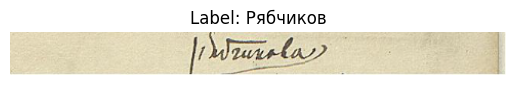

In [ ]:
plt.imshow(test_dataset[0]["img"])
plt.title(f"Label: {test_dataset[0]['label']}")
plt.axis("off")
plt.show()

In [ ]:
collate_fn = OCRCollateFunction(params["dataset_params"]["config"])
test_loader = DataLoader(
    test_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=params["dataset_params"]["num_gpu"],
    pin_memory=True,
    drop_last=False,
    collate_fn=collate_fn
)

In [ ]:
next(iter(test_loader))

{'names': ['SK_lines\\test\\test_0.jpg'],
 'ids': [0],
 'nb_lines': [1],
 'labels': tensor([[ 86, 130, 100, 122, 107, 109, 113, 101]]),
 'raw_labels': ['Рябчиков'],
 'unchanged_labels': ['Рябчиков'],
 'labels_len': [8],
 'imgs': tensor([[[[224., 218., 223.,  ..., 215., 222., 250.],
           [221., 227., 232.,  ..., 222., 229., 250.],
           [233., 237., 225.,  ..., 227., 228., 248.],
           ...,
           [213., 223., 226.,  ..., 219., 215., 248.],
           [216., 218., 224.,  ..., 214., 214., 248.],
           [249., 243., 250.,  ..., 247., 246., 253.]],
 
          [[213., 207., 212.,  ..., 211., 218., 249.],
           [210., 217., 221.,  ..., 218., 224., 250.],
           [222., 226., 214.,  ..., 222., 224., 247.],
           ...,
           [207., 216., 219.,  ..., 223., 217., 248.],
           [212., 213., 220.,  ..., 218., 217., 248.],
           [248., 241., 249.,  ..., 249., 248., 253.]],
 
          [[181., 175., 180.,  ..., 187., 197., 236.],
           [178., 1

In [ ]:
def ctc_remove_successives_identical_ind(ind):
    res = []
    for i in ind:
        if res and res[-1] == i:
            continue
        res.append(i)
    return res

In [ ]:
def get_str_xy(x, y, x_len, y_len):
    """
    see compute_metrics func
    """
    
    x_len = x_reduced_len
    batch_size = y.shape[0]
    ind_x = [x[i][:x_len[i]] for i in range(batch_size)]
    ind_y = [y[i][:y_len[i]] for i in range(batch_size)]
    ind_x = [ctc_remove_successives_identical_ind(t) for t in ind_x]
    str_x = [LM_ind_to_str(charset, t, oov_symbol="") for t in ind_x]
    str_y = [LM_ind_to_str(charset, t) for t in ind_y]
    str_x = [re.sub("( )+", ' ', t).strip(" ") for t in str_x]

    return str_x, str_y

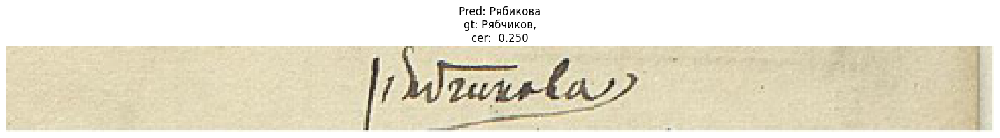

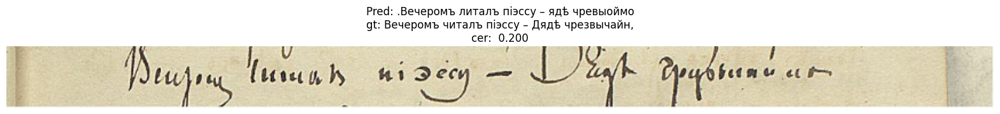

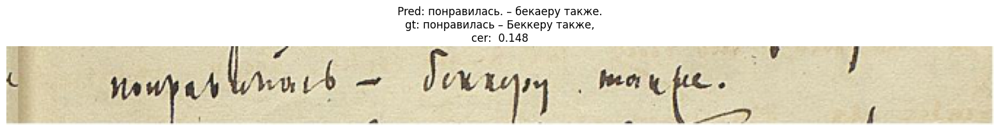

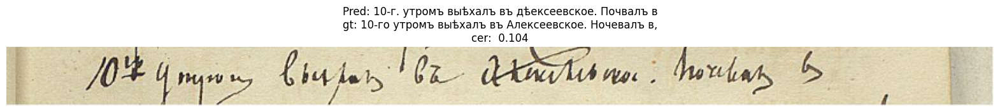

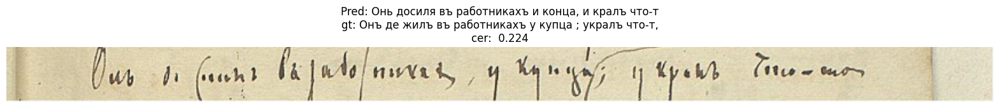

...

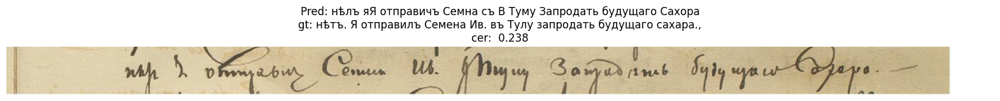

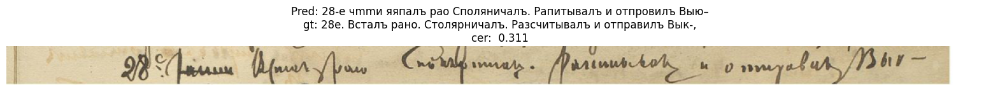

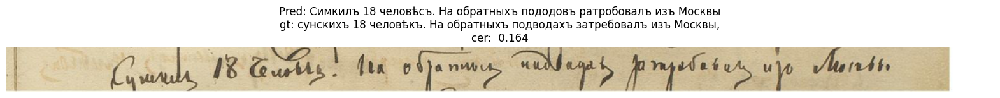

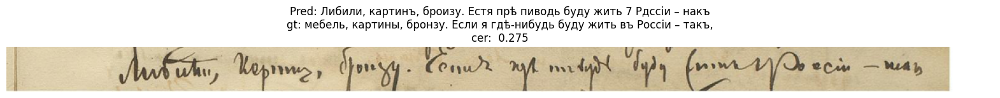

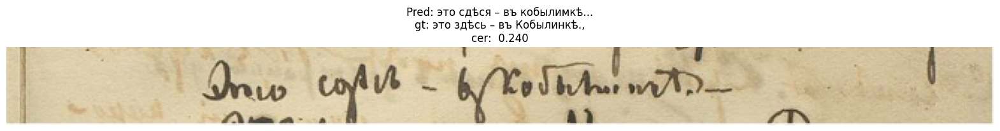

In [ ]:
import editdistance
from basic.utils import edit_wer_from_list, nb_words_from_list, nb_chars_from_list, LM_ind_to_str
import re


model.eval()

with torch.no_grad():
    for ind_batch, batch_data in enumerate(test_loader):
        x = batch_data["imgs"].to(device)
        y = batch_data["labels"].to(device)
        x_reduced_len = [s[1] for s in batch_data["imgs_reduced_shape"]]
        y_len = batch_data["labels_len"]
        
        loss_ctc = CTCLoss(blank=test_dataset.tokens["blank"], reduction="sum")

        global_pred = model(x)
        loss = loss_ctc(global_pred.permute(2, 0, 1), y, x_reduced_len, y_len)
        pred = torch.argmax(global_pred, dim=1).cpu().numpy()

        str_x, str_y = get_str_xy(pred, y.cpu().numpy(), x_reduced_len, y_len)
        str_x = str_x[0]
        str_y = str_y[0]
        cer = editdistance.eval(str_y, str_x) / len(str_y)
        plt.figure(figsize=(20, 20))
        plt.imshow(test_dataset[ind_batch]["img"])
        plt.axis("off")
        plt.title(f"Pred: {str_x}\ngt: {str_y},\ncer: {cer: .3f}")
        plt.show()

**ПОИСК**

In [13]:
import os
import re
from collections import Counter
import numpy as np

def levenshtein_distance(word1, word2):
    dp = np.zeros((len(word1) + 1, len(word2) + 1))
    for i in range(len(word1) + 1):
        for j in range(len(word2) + 1):
            if i == 0:
                dp[i][j] = j
            elif j == 0:
                dp[i][j] = i
            elif word1[i - 1] == word2[j - 1]:
                dp[i][j] = dp[i - 1][j - 1]
            else:
                dp[i][j] = 1 + min(dp[i - 1][j], dp[i][j - 1], dp[i - 1][j - 1])
    return dp[len(word1)][len(word2)]

def find_relevant_words(query, texts, top_n=10):
    query = query.lower()
    fn = ''
    for line, filename in texts:
        
        print(line)
    words = Counter(re.findall(r'\w+', ' '.join(texts).lower()))
    candidates = []

    for word, freq in words.items():
        lev_dist = levenshtein_distance(query, word)
        candidates.append((word, freq, lev_dist))

    # Сортировка по расстоянию Левенштейна и частоте
    candidates = sorted(candidates, key=lambda x: (x[2], -x[1]))
    return candidates[:top_n]

# Чтение файлов из директории
def read_texts_from_dir(directory):
    texts = []
    for filename in os.listdir(directory):
        if filename.endswith(".txt"):
            with open(os.path.join(directory, filename), 'r', encoding='utf-8') as file:
                texts.append((file.read(), filename))
    return texts

# Укажите путь к директории с текстовыми файлами
directory_path = "Model_text_"
texts = read_texts_from_dir(directory_path)

# Запрос от пользователя
query_word = input("Введите слово для поиска: ").strip()

# Поиск
relevant_words = find_relevant_words(query_word, texts, top_n=15)

# Вывод результата
print("\nНаиболее релевантные слова:")
for word, freq, lev_dist in relevant_words:
    print(f"Слово: {word}, Частота: {freq}, Расстояние Левенштейна: {lev_dist}")

1855. Декаб.$
говорилъ мнѣ о піэссѣ.$
Разговоръ съ Чернявскимъ. Предположеніе и просить о$
акинчаніи процесса имъ опровергалось.2$
20-е. Здоровье мое всё плохо – Anais собирается$
въ Петербургъ и продаетъ свое серебро. – Я ничего$
.не дѣлаю – ничѣмъ не занимаюь у меня пос-$
тоянно болитъ горло, чрудь, ознобъ – состояніе.$
совершенно отрицательно. Пріѣхалъ Ѳедоръ изъ$
Степной. Картовеля стерто 8560 четверій$
иVuVщzбeя№ 1/B».»B№мъ чень сbвіs.;FV«z«а9xІ«$
Картоф. муки въ семъ году вытерто 12. 250.$
.21-е. Писалъ письма и корреспонденцію. – Явился$
.Семенъ Ивановичъ Топорковъ– вѣсь день$
съ 11 часовъ до 4-х говорили о сахарномъ$
Заводѣ, – дѣло ладится.$
.22-е. Всё утро занимался съ Семеномъ Иваны$
чемъ. Онъ мнѣ нравится. Кондиціи такіе:$
желат. 2000 р. сер. Сто четвер. ржи, до 160$
.десятинъ даю ему подъ его обработку – свеклу$
принимать по 70 к. сер. берковецъ 12-лу-$
довоrо вѣса. Мы насчитали непремѣннаго$
на будущій годъ сбора до 20 т. берковцевъ.$
23-е. Вечеромъ былъ у чиновника Опекун

In [55]:
import os
import re
from collections import defaultdict
import numpy as np

# Расстояние Левенштейна (Редакционное расстояние)
def levenshtein_distance(word1, word2):
    dp = np.zeros((len(word1) + 1, len(word2) + 1))
    for i in range(len(word1) + 1):
        for j in range(len(word2) + 1):
            if i == 0:
                dp[i][j] = j
            elif j == 0:
                dp[i][j] = i
            elif word1[i - 1] == word2[j - 1]:
                dp[i][j] = dp[i - 1][j - 1]
            else:
                dp[i][j] = 1 + min(dp[i - 1][j], dp[i][j - 1], dp[i - 1][j - 1])
    return dp[len(word1)][len(word2)]

# Поиск релевантных слов

def find_relevant_words(query, texts, filenames, top_n=10):
    query = query.lower()
    candidates = defaultdict(list)

    for filename, text in zip(filenames, texts):
        lines = text.splitlines()
        for line_num, line in enumerate(lines, start=1):
            words = re.findall(r'\w+', line.lower())
            for word in words:
                lev_dist = levenshtein_distance(query, word)
                candidates[word].append((filename, line_num, lev_dist))

    # Упрощение структуры данных для сортировки
    aggregated_candidates = []
    for word, occurrences in candidates.items():
        total_freq = len(occurrences)
        avg_lev_dist = sum([occ[2] for occ in occurrences]) / total_freq
        aggregated_candidates.append((word, total_freq, avg_lev_dist, occurrences))

    # Сортировка по среднему расстоянию Левенштейна и частоте
    aggregated_candidates = sorted(aggregated_candidates, key=lambda x: (x[2], -x[1]))
    return aggregated_candidates[:top_n]

# Чтение файлов из директории
def read_texts_from_dir(directory):
    texts = []
    filenames = []
    for filename in os.listdir(directory):
        if filename.endswith(".txt"):
            with open(os.path.join(directory, filename), 'r', encoding='utf-8') as file:
                texts.append(file.read())
                filenames.append(filename)
    return texts, filenames

# Основной скрипт
if 1:
    # Укажите путь к директории с текстовыми файлами
    directory_path = "Model_text_"
    texts, filenames = read_texts_from_dir(directory_path)

    # Запрос от пользователя
    query_word = input("Введите слово для поиска: ").strip()

    # Поиск
    relevant_words = find_relevant_words(query_word, texts, filenames, top_n=10)

    # Сохранение результата в файл
    output_file = "relevant_words_output.txt"
    with open(output_file, 'w', encoding='utf-8') as file:
        file.write("Наиболее релевантные слова:\n")
        for word, freq, avg_lev_dist, occurrences in relevant_words:
            file.write(f"Слово: {word}, Частота: {freq}, Расстояние Левенштейна: {avg_lev_dist:.2f}\n")
            file.write("Координаты (страница, строка):\n")
            for filename, line_num, lev_dist in occurrences:
                file.write(f"  - Страница: {filename}, Строка: {line_num}\n")

    # Вывод результата
    print("\nНаиболее релевантные слова:")
    for word, freq, avg_lev_dist, occurrences in relevant_words:
        print(f"Слово: {word}, Частота: {freq}, Расстояние Левенштейна: {avg_lev_dist:.2f}")
        print("Координаты (страница, строка):")
        for filename, line_num, lev_dist in occurrences:
            print(f"  - Страница: {filename}, Строка: {line_num}")

    print(f"\nРезультаты сохранены в файл: {output_file}")


Наиболее релевантные слова:
Слово: 5, Частота: 20, Расстояние Левенштейна: 0.00
Координаты (страница, строка):
  - Страница: 28.txt, Строка: 18
  - Страница: 32об.txt, Строка: 6
  - Страница: 17.txt, Строка: 21
  - Страница: 11.txt, Строка: 18
  - Страница: 52об.txt, Строка: 7
  - Страница: 52об.txt, Строка: 21
  - Страница: 48.txt, Строка: 7
  - Страница: 48.txt, Строка: 13
  - Страница: 43об.txt, Строка: 9
  - Страница: 95.txt, Строка: 3
  - Страница: 58об.txt, Строка: 22
  - Страница: 40.txt, Строка: 2
  - Страница: 19об.txt, Строка: 20
  - Страница: 46.txt, Строка: 18
  - Страница: 21об.txt, Строка: 17
  - Страница: 34.txt, Строка: 21
  - Страница: 35.txt, Строка: 13
  - Страница: 26.txt, Строка: 7
  - Страница: 32.txt, Строка: 14
  - Страница: 25.txt, Строка: 15
Слово: и, Частота: 510, Расстояние Левенштейна: 1.00
Координаты (страница, строка):
  - Страница: 51об.txt, Строка: 3
  - Страница: 51об.txt, Строка: 6
  - Страница: 51об.txt, Строка: 13
  - Страница: 29об.txt, Строка: 1


In [4]:
import os
import re
from collections import defaultdict
import numpy as np
from PIL import Image, ImageDraw
import shutil

def levenshtein_distance(word1, word2):
    dp = np.zeros((len(word1) + 1, len(word2) + 1))
    for i in range(len(word1) + 1):
        for j in range(len(word2) + 1):
            if i == 0:
                dp[i][j] = j
            elif j == 0:
                dp[i][j] = i
            elif word1[i - 1] == word2[j - 1]:
                dp[i][j] = dp[i - 1][j - 1]
            else:
                dp[i][j] = 1 + min(dp[i - 1][j], dp[i][j - 1], dp[i - 1][j - 1])
    return dp[len(word1)][len(word2)]


def find_relevant_words(query, texts, filenames, top_n=10):
    query = query.lower()
    candidates = defaultdict(list)

    for filename, text in zip(filenames, texts):
        lines = text.splitlines()
        for line_num, line in enumerate(lines, start=1):
            words = re.findall(r'\w+', line.lower())
            for word in words:
                lev_dist = levenshtein_distance(query, word)
                candidates[word].append((filename, line_num, lev_dist))

    aggregated_candidates = []
    for word, occurrences in candidates.items():
        total_freq = len(occurrences)
        avg_lev_dist = sum([occ[2] for occ in occurrences]) / total_freq
        aggregated_candidates.append((word, total_freq, avg_lev_dist, occurrences))

    aggregated_candidates = sorted(aggregated_candidates, key=lambda x: (x[2], -x[1]))
    return aggregated_candidates[:top_n]

def read_texts_from_dir(directory):
    texts = []
    filenames = []
    for filename in os.listdir(directory):
        if filename.endswith(".txt"):
            with open(os.path.join(directory, filename), 'r', encoding='utf-8') as file:
                texts.append(file.read())
                filenames.append(filename)
    return texts, filenames


def read_lines_from_frame_file(frame_file):
    with open(frame_file, 'r', encoding='utf-8') as file:
        lines = file.readlines()
    total_lines = int(lines[0].strip())
    line_coordinates = []
    for i in range(1, len(lines), 4):
        line_number = int(lines[i].strip().split()[-1])
        left = tuple(map(int, lines[i + 1].strip().split()))
        middle = tuple(map(int, lines[i + 2].strip().split()))
        right = tuple(map(int, lines[i + 3].strip().split()))
        line_coordinates.append((line_number, left, middle, right))
    return total_lines, line_coordinates


def highlight_lines_on_image(image_path, line_coordinates, output_path, word):
    image = Image.open(image_path).convert("RGBA")
    overlay = Image.new("RGBA", image.size, (255, 255, 255, 0))
    draw = ImageDraw.Draw(overlay)

    for _, left, middle, right in line_coordinates:
        x1, y1 = left
        x2, y2 = right
        rect_top_left = (x1, y1 - 30)
        rect_bottom_right = (x2, y2 + 30)

        draw.rectangle([rect_top_left, rect_bottom_right], fill=(100, 0, 0, 100))

    highlighted_image = Image.alpha_composite(image, overlay)
    highlighted_image = highlighted_image.convert("RGB")
    highlighted_image.save(output_path)

if 1:
    directory_path = "Model_text_"
    frame_path = "Frames"
    img_path = "Img"
    output_img_path = "Highlighted_Images"

    if os.path.exists(output_img_path):
        shutil.rmtree(output_img_path)

    os.makedirs(output_img_path, exist_ok=True)

    texts, filenames = read_texts_from_dir(directory_path)

    top_n = int(input("Введите top_n для поиска: ").strip())

    query_word = input("Введите слово для поиска: ").strip()

    relevant_words = find_relevant_words(query_word, texts, filenames, top_n=top_n)
    output_file = "relevant_words_output.txt"
    with open(output_file, 'w', encoding='utf-8') as file:
        file.write("Наиболее релевантные слова:\n")
        for word, freq, avg_lev_dist, occurrences in relevant_words:
            file.write(f"Слово: {word}, Частота: {freq}, Расстояние Левенштейна: {avg_lev_dist:.2f}\n")
            file.write("Координаты (страница, строка):\n")
            for filename, line_num, lev_dist in occurrences:
                file.write(f"  - Страница: {filename}, Строка: {line_num}\n")

    for word, _, _, occurrences in relevant_words:
        for filename, line_num, _ in occurrences:
            base_name = filename.split(".")[0]
            frame_file = os.path.join(frame_path, f"438-1-219 л{base_name}.txt")
            img_file = os.path.join(img_path, f"438-1-219 л{base_name}.jpg")
            if os.path.exists(frame_file) and os.path.exists(img_file):
                _, line_coordinates = read_lines_from_frame_file(frame_file)

                matching_lines = [line for line in line_coordinates if line[0] == line_num]
                output_image_file = os.path.join(output_img_path, f"438-1-219 л{base_name}_highlighted.jpg")
                highlight_lines_on_image(img_file, matching_lines, output_image_file, word)

    print("\nНаиболее релевантные слова:")
    for word, freq, avg_lev_dist, occurrences in relevant_words:
        print(f"Слово: {word}, Частота: {freq}, Расстояние Левенштейна: {avg_lev_dist:.2f}")
        print("Координаты (страница, строка):")
        for filename, line_num, lev_dist in occurrences:
            print(f"  - Страница: {filename}, Строка: {line_num}")

    print(f"\nРезультаты сохранены в файл: {output_file}")
    print(f"Выделенные изображения сохранены в папке: {output_img_path}")

import os
from IPython.display import display, Image, HTML
from ipywidgets import interact

folder_path = "Highlighted_Images"

image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

def show_image(index):
    image_path = os.path.join(folder_path, image_files[index])
    display(HTML(f"<h3>{image_files[index]}</h3>"))
    display(Image(filename=image_path, width=600))

interact(show_image, index=(0, len(image_files) - 1))


Наиболее релевантные слова:
Слово: выксу, Частота: 14, Расстояние Левенштейна: 1.00
Координаты (страница, строка):
  - Страница: 15.txt, Строка: 17
  - Страница: 48об.txt, Строка: 7
  - Страница: 75об.txt, Строка: 6
  - Страница: 75.txt, Строка: 22
  - Страница: 75.txt, Строка: 23
  - Страница: 43об.txt, Строка: 5
  - Страница: 7об.txt, Строка: 7
  - Страница: 7об.txt, Строка: 16
  - Страница: 52.txt, Строка: 23
  - Страница: 21об.txt, Строка: 4
  - Страница: 2об.txt, Строка: 12
  - Страница: 21.txt, Строка: 6
  - Страница: 21.txt, Строка: 9
  - Страница: 23об.txt, Строка: 4
Слово: выксѣ, Частота: 6, Расстояние Левенштейна: 1.00
Координаты (страница, строка):
  - Страница: 75об.txt, Строка: 8
  - Страница: 52об.txt, Строка: 2
  - Страница: 58об.txt, Строка: 21
  - Страница: 40.txt, Строка: 2
  - Страница: 2об.txt, Строка: 26
  - Страница: 22.txt, Строка: 10
Слово: выксы, Частота: 3, Расстояние Левенштейна: 1.00
Координаты (страница, строка):
  - Страница: 11.txt, Строка: 8
  - Страниц

interactive(children=(IntSlider(value=8, description='index', max=16), Output()), _dom_classes=('widget-intera…

<function __main__.show_image(index)>